## Import Packages

In [147]:
import scvi
import scanpy as sc
import pandas as pd
import celltypist
from celltypist import models
import matplotlib.pyplot as plt
import seaborn as sb
sc.settings.set_figure_params(dpi=100, facecolor='white')

## Import Anndata

In [2]:
adata = sc.read("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/CD8_raw_obj.h5ad")
adataraw=sc.read("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/RawData.h5ad")

In [3]:
adata = adata[adata.obs['Immun3'].isin(['T-cell']),:]

In [4]:
adata.X = adataraw[adataraw.obs.index.isin(adata.obs.index),:].X

/home/lugli/spuccio/anaconda3/envs/scanpy19/lib/python3.10/site-packages/scipy/sparse/_index.py:137: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


## Starting from Raw Data

In [5]:
adata.layers['raw'] = adata.X

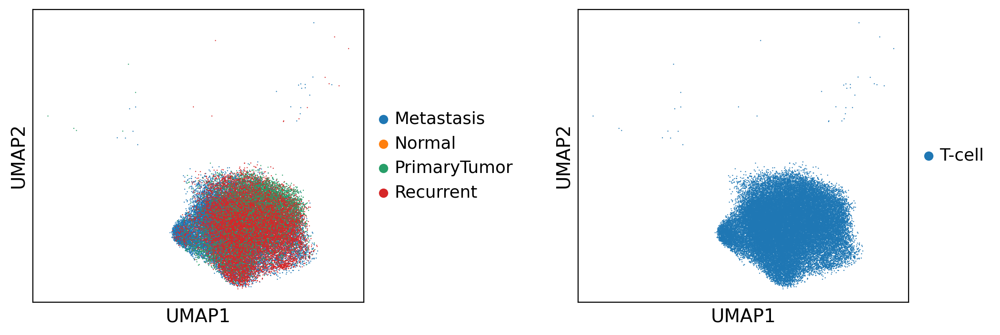

In [6]:
sc.pl.umap(adata, color=['Type','Immun3'],ncols=2,wspace=0.5,title=['',''])

## Exclude Normal

In [7]:
adata = adata[~adata.obs['Type'].isin(['Normal']),:]

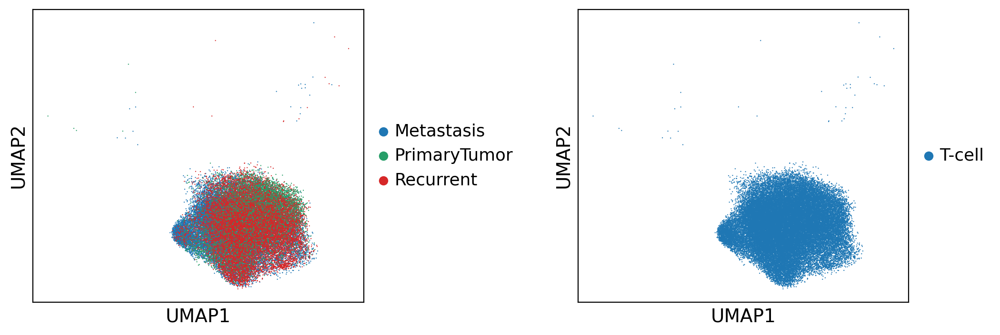

In [8]:
sc.pl.umap(adata, color=['Type','Immun3'],ncols=2,wspace=0.5,title=['',''])

## Processing Data

In [9]:
sc.pp.normalize_total(adata, target_sum=10000)

In [10]:
sc.pp.log1p(adata)

## Create scVI Model

In [11]:
model = models.Model.load(model = 'Immune_All_Low.pkl')

In [12]:
adata.X = adata.X.A

## Classification

In [13]:
predictionsLow = celltypist.annotate(adata, model = 'Immune_All_Low.pkl', majority_voting = True)

🔬 Input data has 45021 cells and 10439 genes
🔗 Matching reference genes in the model
🧬 3469 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, construct one before the over-clustering
2023-04-12 15:39:09.152236: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [14]:
pd.DataFrame(predictionsLow.to_adata().obs['majority_voting'].value_counts()).head(50)

,majority_voting
Tem/Trm cytotoxic T cells,16763
Tem/Effector helper T cells,11359
Regulatory T cells,6999
Tcm/Naive helper T cells,4554
Memory B cells,3144
Plasma cells,742
B cells,461
Type 1 helper T cells,285
Naive B cells,264
CD16- NK cells,251


## Remove contaminant

In [15]:
adata = adata[predictionsLow.to_adata().obs['majority_voting'].isin(['Tem/Trm cytotoxic T cells',
                                                                   'Tem/Effector helper T cells','Regulatory T cells',
                                                                   'Tcm/Naive helper T cells','Type 1 helper T cells']),:]

## Take first 3000 HVG

In [22]:
adata.raw = adata

In [23]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=3000,
    # subset=True, # to automatically subset to the 3000 genes
    layer="raw",
    flavor="seurat_v3"
)

In [24]:
bdata = adata.copy()

In [25]:
adata = adata[:, adata.var.highly_variable].copy()

In [16]:
sc.pp.scale(adata)

In [17]:
sc.tl.pca(adata)

In [18]:
sc.pp.neighbors(adata)

In [19]:
adata.shape

(39960, 10439)

## Integration

In [20]:
scvi.model.SCVI.setup_anndata(adata, layer="raw", batch_key = 'Type')

Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
Unable to initialize backend 'gpu': NOT_FOUND: Could not find registered platform with name: "cuda". Available platform names are: Host Interpreter
Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.


In [21]:
model = scvi.model.SCVI(adata)

In [22]:
model.view_anndata_setup()

Anndata setup with scvi-tools version 0.16.4.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'raw',
│   'batch_key': 'Type',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_cells          │ 39960 │
│          n_vars          │ 10439 │
│         n_batch          │   3   │
│         n_labels         │   1   │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │    adata.layers['raw']    │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location  ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Type'] │  Metastasis  │          0          │
│                   │ PrimaryTumor │          1          │
│                   │  Recurrent   │          2          │
└───────────────────┴──────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [23]:
model.train(use_gpu=False)

Created a temporary directory at /tmp/tmpbihv0zhm
Writing /tmp/tmpbihv0zhm/_remote_module_non_sriptable.py
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Set SLURM handle signals.


Epoch 200/200: 100%|██████████| 200/200 [48:07<00:00, 14.44s/it, loss=3.05e+03, v_num=1]


In [24]:
model.save("/home/lugli/spuccio/Projects/SP039/modelscviCD8", overwrite=True)

In [25]:
adata.obsm["X_scvi"] = model.get_latent_representation()

In [26]:
adata.layers["scvi_expr"] = model.get_normalized_expression(adata, n_samples=25, return_mean=True)

In [27]:
sc.pp.neighbors(adata, use_rep="X_scvi", metric="correlation")

## New UMAP

In [28]:
sc.tl.umap(adata, min_dist=0.4)

## Clustering

In [29]:
sc.tl.leiden(adata, resolution = 0.2,key_added = "Sub_leiden_0.2") 
sc.tl.leiden(adata, resolution = 0.3,key_added = "Sub_leiden_0.3") 
sc.tl.leiden(adata, resolution = 0.4,key_added = "Sub_leiden_0.4") 
sc.tl.leiden(adata, resolution = 0.5,key_added = "Sub_leiden_0.5") 
sc.tl.leiden(adata, resolution = 0.6,key_added = "Sub_leiden_0.6") 
sc.tl.leiden(adata, resolution = 0.7,key_added = "Sub_leiden_0.7") 
sc.tl.leiden(adata, resolution = 0.8,key_added = "Sub_leiden_0.8") 
sc.tl.leiden(adata, resolution = 1.0,key_added = "Sub_leiden_1.0") 

## Plot all resolutions

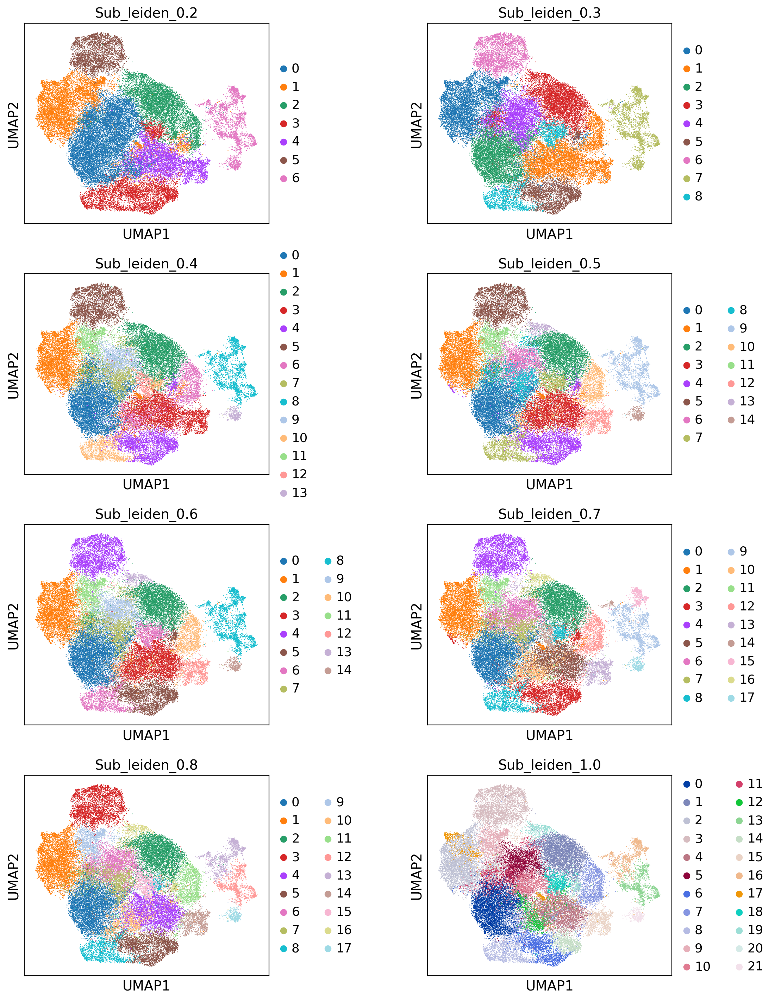

In [30]:
sc.pl.umap(adata, color=['Sub_leiden_0.2', 'Sub_leiden_0.3', 'Sub_leiden_0.4','Sub_leiden_0.5','Sub_leiden_0.6', 'Sub_leiden_0.7','Sub_leiden_0.8','Sub_leiden_1.0'],ncols=2,wspace=0.5)

## Plot Resolution 4 with some phenotype genes

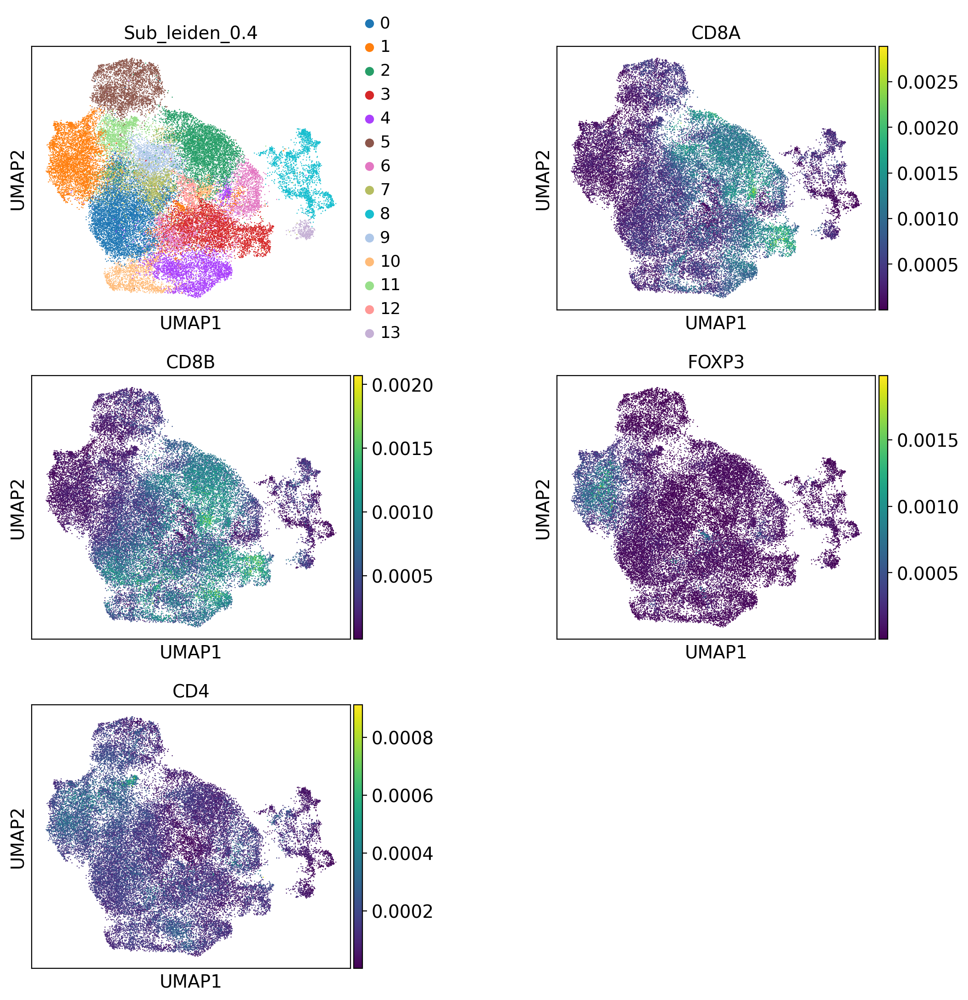

In [65]:
sc.pl.umap(adata, color=['Sub_leiden_0.4','CD8A','CD8B','FOXP3','CD4'],ncols=2,wspace=0.5)

In [63]:
#cdata = adata.raw.to_adata()

## Use all Genes for Degs

In [46]:
adata.layers['scaled'] = adata.X

In [47]:
adata.X = adata.layers['scvi_expr']

## Filter CD4

In [48]:
import scprep

<Axes: xlabel='CD8A', ylabel='Number of cells'>

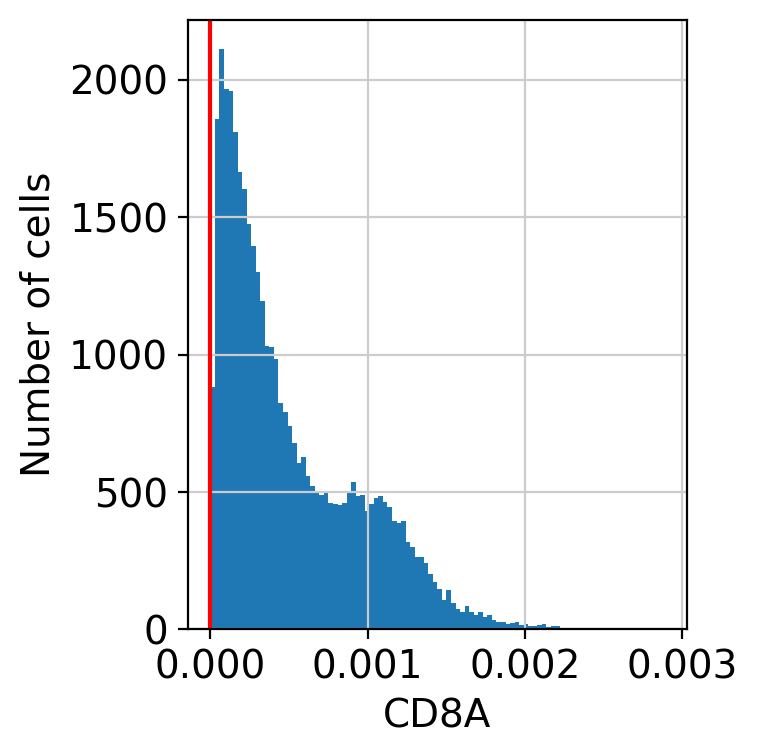

In [49]:
scprep.plot.plot_gene_set_expression(adata[:, ['CD8A']].to_df(),
                                     xlabel='CD8A',cutoff=0)

<Axes: xlabel='CD4', ylabel='Number of cells'>

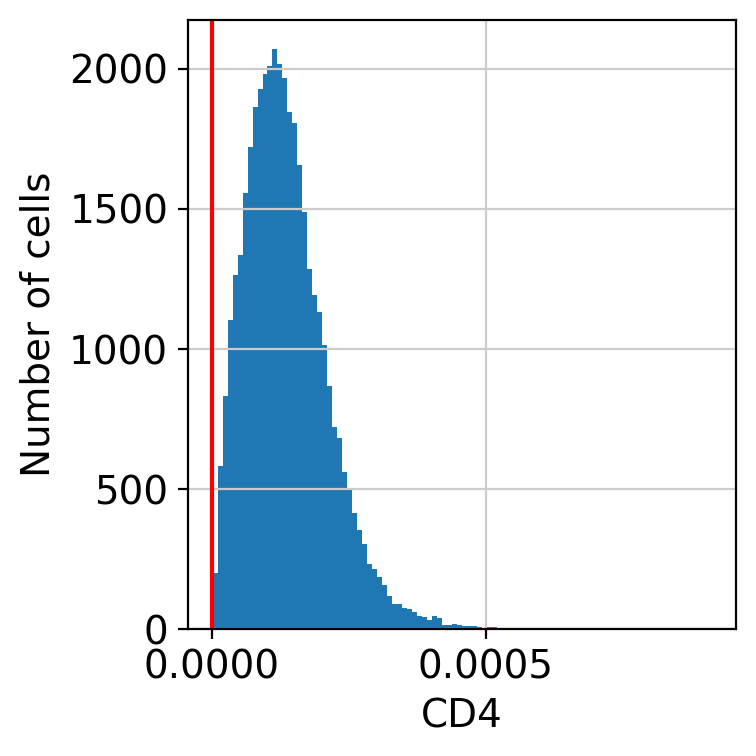

In [50]:
scprep.plot.plot_gene_set_expression(adata[:, ['CD4']].to_df(),
                                     xlabel='CD4',cutoff=0)

<Axes: xlabel='FOXP3', ylabel='Number of cells'>

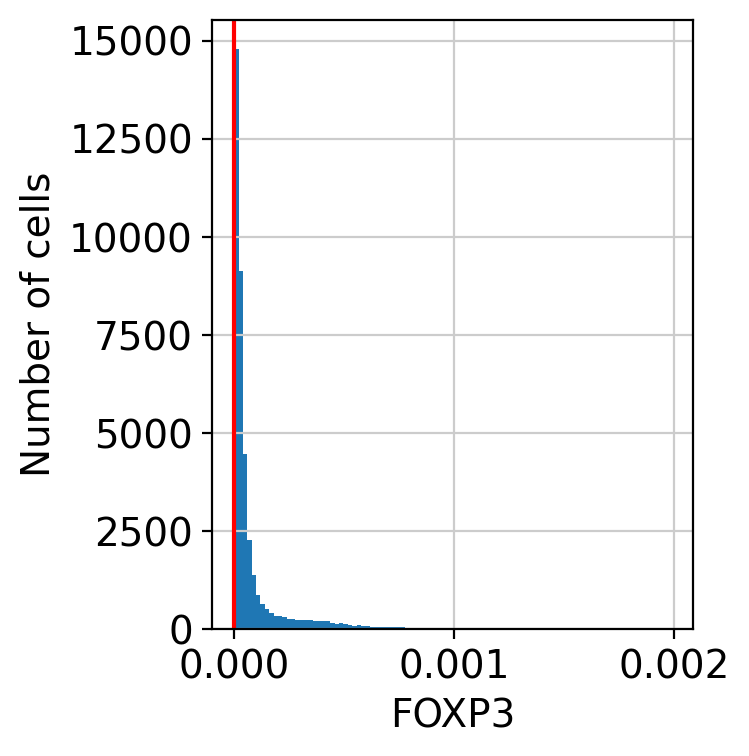

In [51]:
scprep.plot.plot_gene_set_expression(adata[:, ['FOXP3']].to_df(),
                                     xlabel='FOXP3',cutoff=0)

<Axes: xlabel='CD8A', ylabel='Number of cells'>

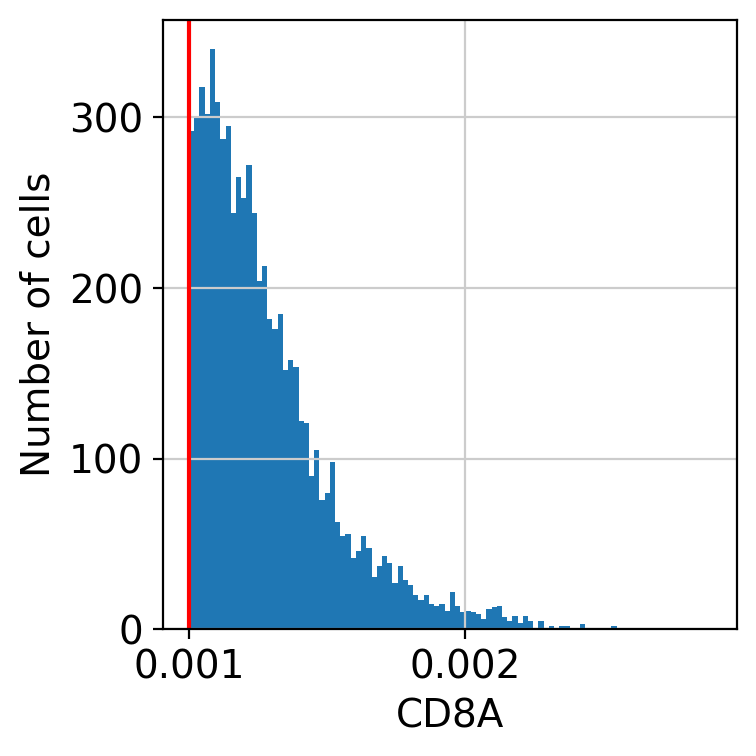

In [53]:
scprep.plot.plot_gene_set_expression(adata[:, ['CD8A']].to_df().loc[adata[:, ['CD8A']].to_df()['CD8A']>=0.001],
                                     xlabel='CD8A',cutoff=0.001)

<Axes: xlabel='CD4', ylabel='Number of cells'>

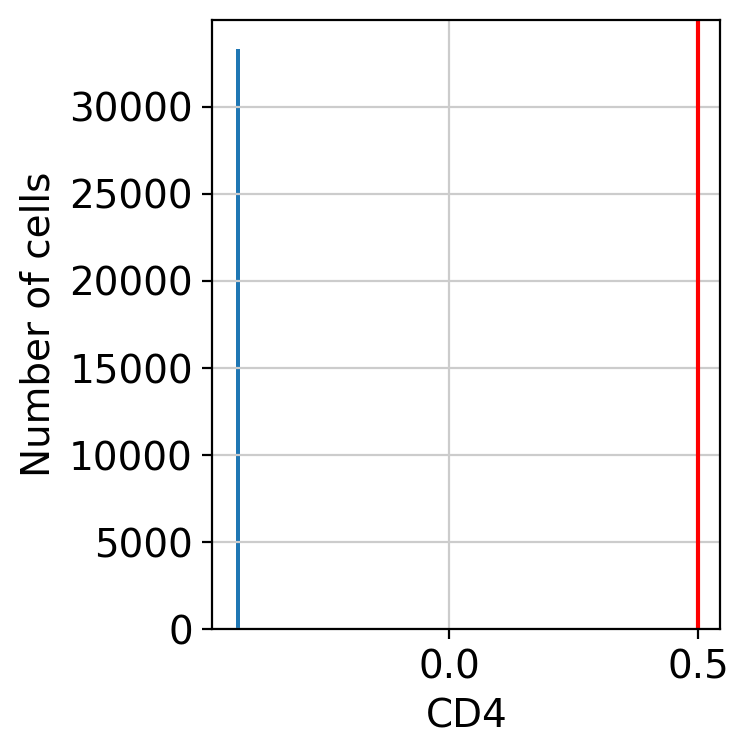

In [41]:
scprep.plot.plot_gene_set_expression(adata[:, ['CD4']].to_df().loc[adata[:, ['CD4']].to_df()['CD4']<=0.5],
                                     xlabel='CD4',cutoff=0.5)

<Axes: xlabel='FOXP3', ylabel='Number of cells'>

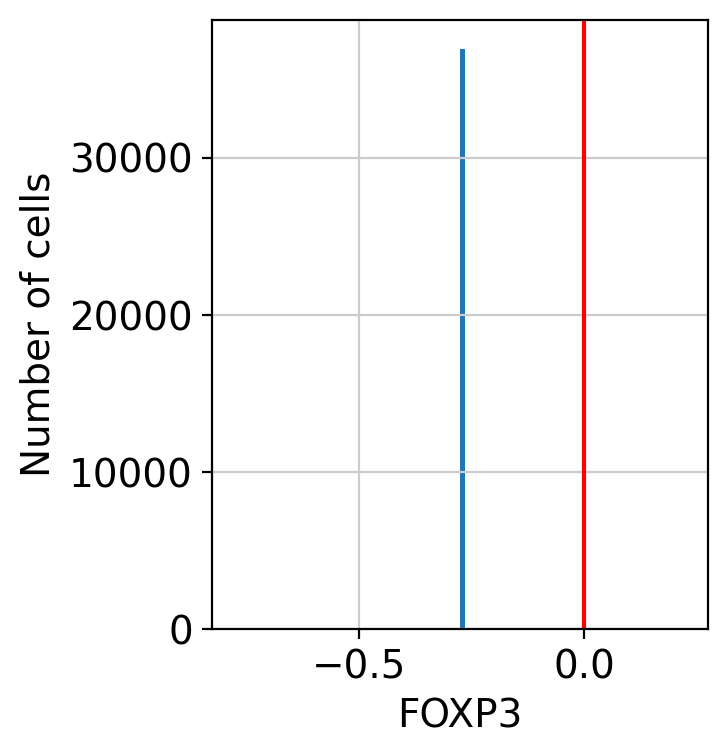

In [42]:
scprep.plot.plot_gene_set_expression(adata[:, ['FOXP3']].to_df().loc[adata[:, ['FOXP3']].to_df()['FOXP3']<=0.001],
                                     xlabel='FOXP3',cutoff=0)

In [61]:
adata.obs['predicted_labels'] = pd.DataFrame(predictionsLow.to_adata().obs['predicted_labels'])

In [72]:
adata = adata[adata.obs['predicted_labels'].isin(['Tem/Trm cytotoxic T cells','Regulatory T cells','Tem/Effector helper T cells','Tcm/Naive helper T cells','Trm cytotoxic T cells',
'Type 1 helper T cells','Treg(diff)','Type 17 helper T cells','Tcm/Naive cytotoxic T cells','Follicular helper T cells','Tem/Temra cytotoxic T cells',
'CRTAM+ gamma-delta T cells','Memory CD4+ cytotoxic T cells','Cycling T cells','gamma-delta T cells']),:]

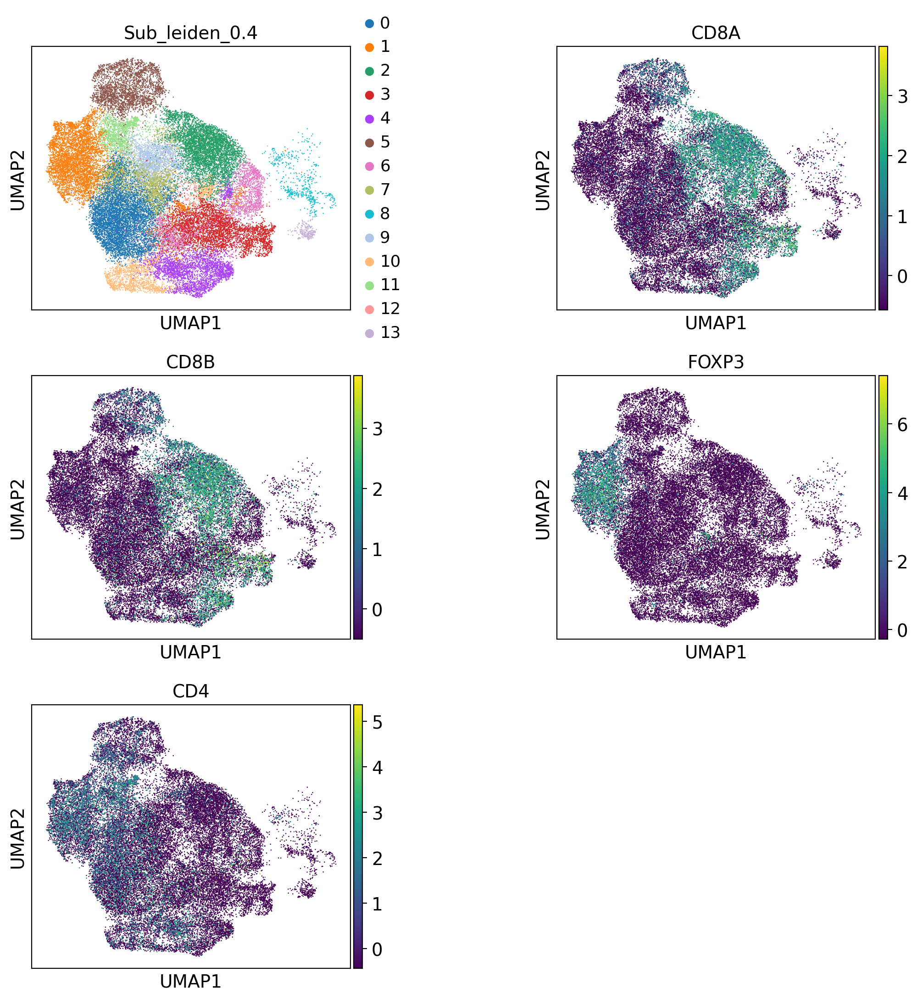

In [117]:
#pd.DataFrame(adata.obs['predicted_labels'].value_counts()).head(50)
sc.pl.umap(adata, color=['Sub_leiden_0.4','CD8A','CD8B','FOXP3','CD4'],layer="scaled",
           ncols=2,wspace=0.5)

In [118]:
cdata = adata[adata.obs['predicted_labels'].isin(['Tem/Trm cytotoxic T cells','Tcm/Naive cytotoxic T cells']),:]

In [119]:
cdata.shape

(9499, 10439)

In [120]:
cdata = cdata[cdata.obs.index.isin(cdata[:, ['CD4']].to_df().loc[cdata[:, ['CD4']].to_df()['CD4']<=0.01].index),:]

In [121]:
cdata = cdata[cdata.obs.index.isin(cdata[:, ['FOXP3']].to_df().loc[cdata[:, ['FOXP3']].to_df()['FOXP3']<=0.01].index),:]

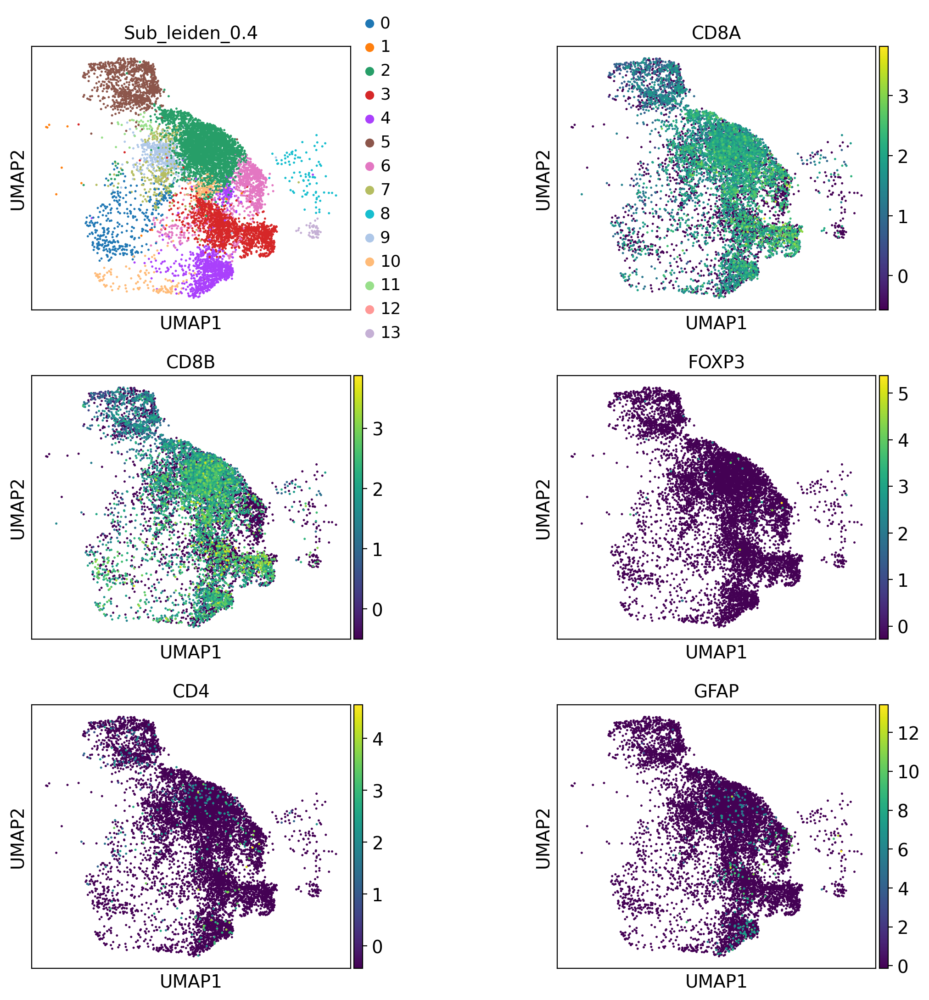

In [123]:
sc.pl.umap(cdata, color=['Sub_leiden_0.4','CD8A','CD8B','FOXP3','CD4','GFAP'],layer="scaled",
           ncols=2,wspace=0.5)

In [125]:
CD8obj =adata[adata.obs.index.isin(adata[:, ['CD8A']].to_df().loc[adata[:, ['CD8A']].to_df()['CD8A']>=0.001].index),:]

In [126]:
CD8obj = CD8obj[CD8obj.obs.index.isin(CD8obj[:, ['FOXP3']].to_df().loc[adata[:, ['FOXP3']].to_df()['FOXP3']<=0.001].index),:]

In [127]:
CD8obj = CD8obj[CD8obj.obs.index.isin(CD8obj[:, ['GFAP']].to_df().loc[adata[:, ['GFAP']].to_df()['GFAP']<=0.001].index),:]

In [131]:
CD8obj = ddata[ddata.obs['Sub_leiden_0.4'].isin(['2','3','4','5','9']),:]

In [132]:
CD8obj

View of AnnData object with n_obs × n_vars = 7229 × 10439
    obs: 'SampleID', 'GEO_RNA', 'Cohort', 'Type', 'Subtype', 'Diagnosis', 'Grade', 'Location', 'IDH1_Status', 'EGFR_Status', 'MGMT', 'Sample', 'Sex', 'Age', 'Sorted', 'MET', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_info', 'batch', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_1.0', 'predicted_labels', 'majority_voting', 'conf_score', 'diff', 'Immun2', 'Immun3', 'copykit', 'over_clustering', '_scvi_batch', '_scvi_labels', 'Sub_leiden_0.2', 'Sub_leiden_0.3', 'Sub_leiden_0.4', 'Sub_leiden_0.5', 'Sub_leiden_0.6', 'Sub_leiden_0.7', 'Sub_leiden_0.8', 'Sub_leiden_1.0'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mt', 'ribo', 'hb', 'mean', 'std'
    uns: 'Type_

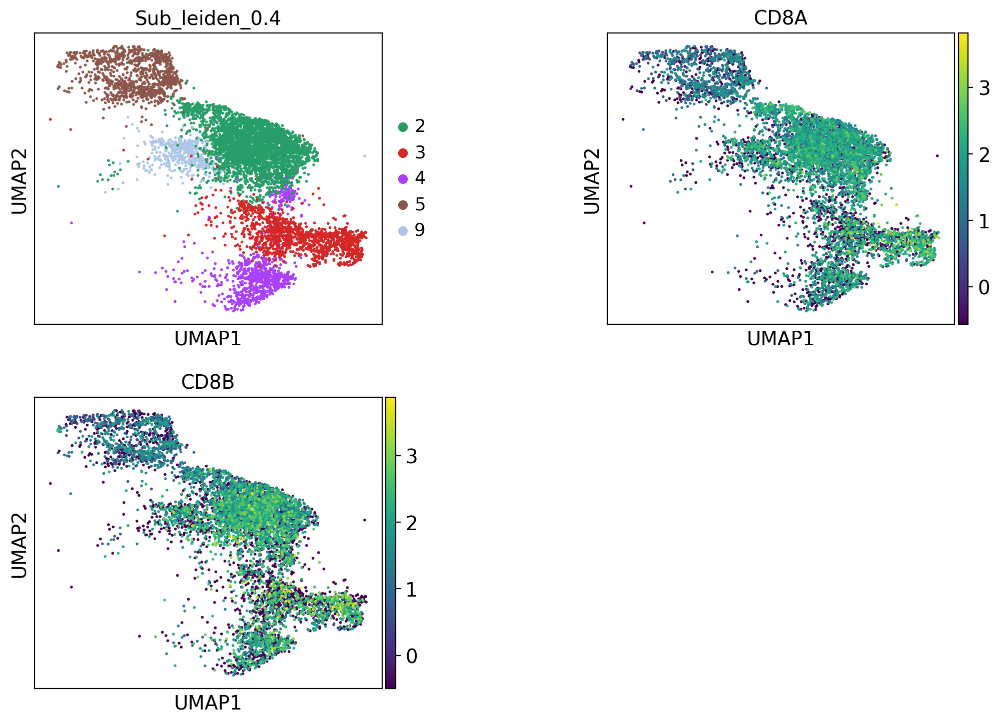

In [133]:
sc.pl.umap( CD8obj, color=['Sub_leiden_0.4','CD8A','CD8B'],layer="scaled",
           ncols=2,wspace=0.5)

In [102]:
CD8obj = CD8obj[CD8obj.obs.index.isin(CD8obj[:, ['CD8A']].to_df().loc[CD8obj[:, ['CD8A']].to_df()['CD8A']>=0.0002].index),:]

View of AnnData object with n_obs × n_vars = 7135 × 10439
    obs: 'SampleID', 'GEO_RNA', 'Cohort', 'Type', 'Subtype', 'Diagnosis', 'Grade', 'Location', 'IDH1_Status', 'EGFR_Status', 'MGMT', 'Sample', 'Sex', 'Age', 'Sorted', 'MET', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_info', 'batch', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_1.0', 'predicted_labels', 'majority_voting', 'conf_score', 'diff', 'Immun2', 'Immun3', 'copykit', 'over_clustering', '_scvi_batch', '_scvi_labels', 'Sub_leiden_0.2', 'Sub_leiden_0.3', 'Sub_leiden_0.4', 'Sub_leiden_0.5', 'Sub_leiden_0.6', 'Sub_leiden_0.7', 'Sub_leiden_0.8', 'Sub_leiden_1.0'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mt', 'ribo', 'hb', 'mean', 'std'
    uns: 'Type_

In [117]:
#CD8obj = CD8obj[CD8obj.obs['Sub_leiden_0.2'].isin(['0','1','2']),:]

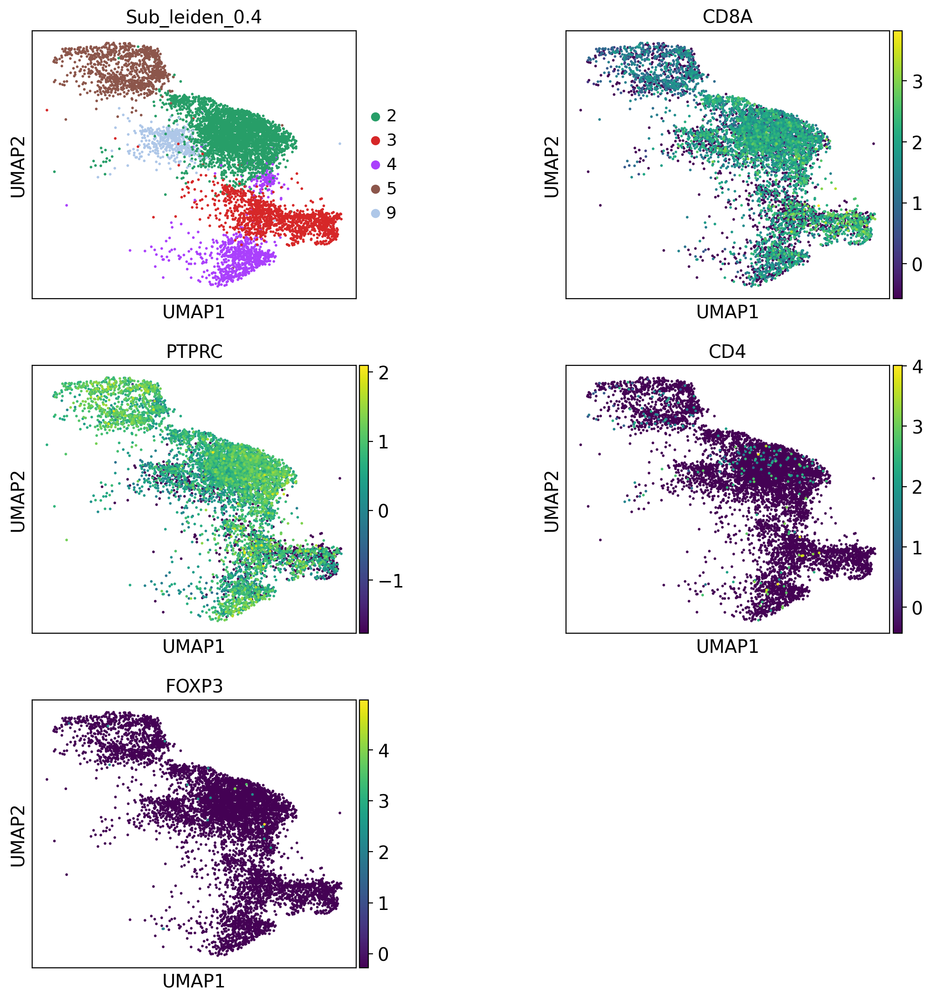

In [135]:
sc.pl.umap(CD8obj, color=['Sub_leiden_0.4','CD8A','PTPRC','CD4','FOXP3'],layer="scaled",
           ncols=2,wspace=0.5)

## Plotting Markers

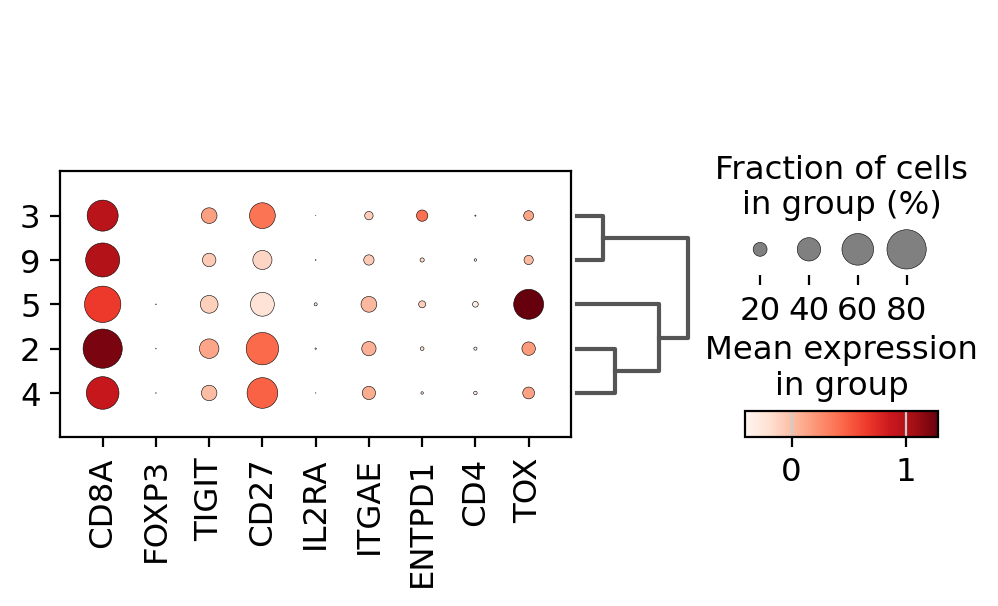

In [144]:
sc.pl.dotplot(CD8obj, ['CD8A','FOXP3','TIGIT','CD27','IL2RA','ITGAE','ENTPD1','CD4','TOX'],
              'Sub_leiden_0.4',layer="scaled", dendrogram=True)

In [145]:
CD8obj

AnnData object with n_obs × n_vars = 7229 × 10439
    obs: 'SampleID', 'GEO_RNA', 'Cohort', 'Type', 'Subtype', 'Diagnosis', 'Grade', 'Location', 'IDH1_Status', 'EGFR_Status', 'MGMT', 'Sample', 'Sex', 'Age', 'Sorted', 'MET', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'doublet_scores', 'doublet_info', 'batch', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_1.0', 'predicted_labels', 'majority_voting', 'conf_score', 'diff', 'Immun2', 'Immun3', 'copykit', 'over_clustering', '_scvi_batch', '_scvi_labels', 'Sub_leiden_0.2', 'Sub_leiden_0.3', 'Sub_leiden_0.4', 'Sub_leiden_0.5', 'Sub_leiden_0.6', 'Sub_leiden_0.7', 'Sub_leiden_0.8', 'Sub_leiden_1.0'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mt', 'ribo', 'hb', 'mean', 'std'
    uns: 'Type_colors',

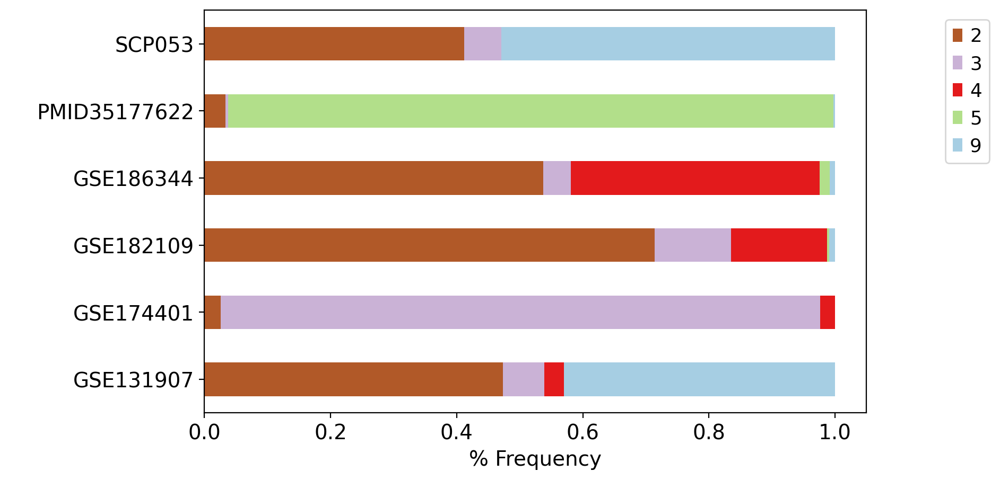

In [148]:
fig, (ax1) = plt.subplots(1,1, figsize=(8,5))
ax1 = CD8obj.obs.groupby("Cohort")["Sub_leiden_0.4"].value_counts(normalize=True).unstack().plot.barh(stacked=True,legend=False,ax=ax1,colormap='Paired_r')
ax1.set_xlabel("% Frequency")
ax1.set_ylabel(" ")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.2, 1.0))

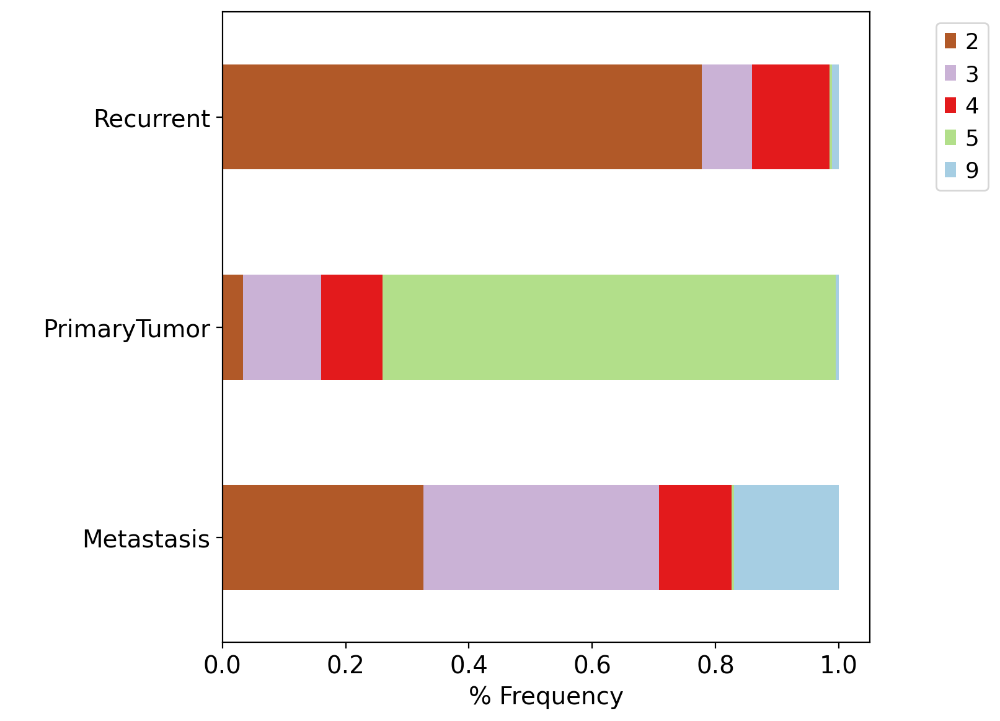

In [149]:

fig, (ax1) = plt.subplots(1,1, figsize=(17/2.54,17/2.54))
ax1 = CD8obj.obs.groupby("Type")["Sub_leiden_0.4"].value_counts(normalize=True).unstack().plot.barh(stacked=True,legend=False,ax=ax1,colormap='Paired_r')
ax1.set_xlabel("% Frequency")
ax1.set_ylabel(" ")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.2, 1.0))

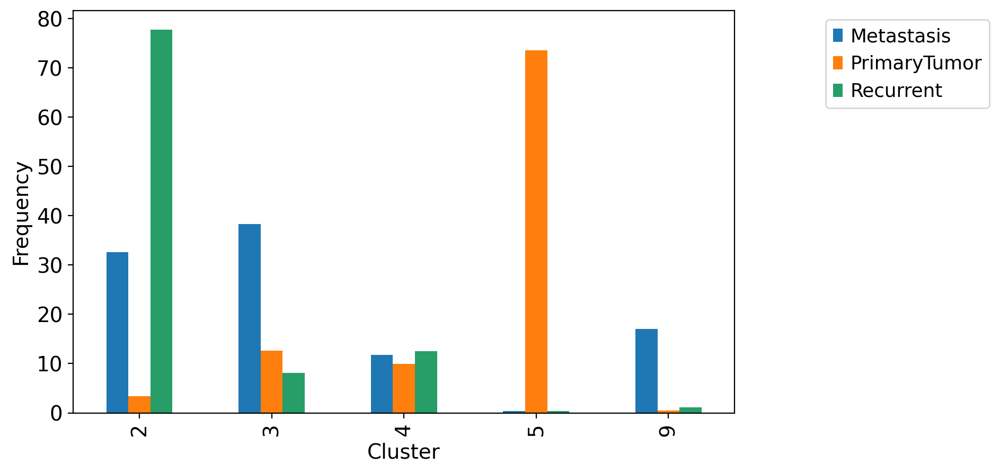

In [151]:
fig, (ax1) = plt.subplots(1,1, figsize=(8,5))
#
ax1 = (pd.crosstab(CD8obj.obs["Sub_leiden_0.4"], CD8obj.obs.Type,normalize='columns')*100).plot.bar(stacked=False,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.4, 1.0))

In [218]:
CD8obj.X = CD8obj.layers['raw']

In [219]:
sc.pp.normalize_total(CD8obj, target_sum=1e4) 
sc.pp.log1p(CD8obj) 

In [226]:
sc.tl.rank_genes_groups(CD8obj, groupby="Type",use_raw=False,pts=0.20,method='t-test')

## Degs

In [227]:
sc.get.rank_genes_groups_df(CD8obj, group="Metastasis").to_csv("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/Metastasis.csv",
                                                                             sep="\t",header=True,index=False)

In [228]:
pd.DataFrame(sc.get.rank_genes_groups_df(CD8obj, group="PrimaryTumor")).to_csv("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/PrimaryTumor.csv",
                                                                             sep="\t",header=True,index=False)

In [229]:
sc.get.rank_genes_groups_df(CD8obj, group="Recurrent").to_csv("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/Recurrent.csv",
                                                                             sep="\t",header=True,index=False)

In [247]:
#pd.DataFrame(CD8obj.uns['rank_genes_groups']['names']).head(50)

In [235]:
markers = {}
cats = CD8obj.obs.Type.cat.categories
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)

    cell_type_df = pd.DataFrame(sc.get.rank_genes_groups_df(CD8obj, group=c))
    cell_type_df= cell_type_df.set_index("names")
    cell_type_df = cell_type_df.sort_values("pvals_adj", ascending=False)

    # those genes with higher expression in group 1
    cell_type_df = cell_type_df[cell_type_df.logfoldchanges.abs() > 1]
    # significance
    cell_type_df = cell_type_df[cell_type_df["pvals_adj"] < 0.05]
    # genes with sufficient expression
    cell_type_df = cell_type_df[cell_type_df["pct_nz_group"] > 0.2]

    markers[c] = cell_type_df.index.tolist()[:20]

In [236]:
sc.tl.dendrogram(CD8obj, groupby="Type", use_rep="X_scvi")

In [243]:
#markers

sc.pl.dotplot(
    CD8obj,
    markers,
    groupby='Type',
    dendrogram=True,
    color_map="Blues",
    swap_axes=False,
    use_raw=False
)

sc.pl.matrixplot(
    CD8obj, 
    markers, 
    groupby='Type',
    standard_scale="var",
    dendrogram=True
)


In [248]:
#pd.DataFrame(CD8obj.uns['rank_genes_groups']['names']).head(50)

In [244]:
sc.tl.rank_genes_groups(CD8obj, groupby="Sub_leiden_0.4",use_raw=False,pts=0.20,method='t-test_overestim_var')

In [245]:
result = CD8obj.uns['rank_genes_groups']

In [246]:
groups = result['names'].dtype.names
with pd.ExcelWriter('/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/DEGS_Resoultion04_checked.xlsx') as writer:
    for _ in range(len(groups)):
        sc.get.rank_genes_groups_df(CD8obj,
                                    group=groups[_], key='rank_genes_groups').to_excel(writer, sheet_name=groups[_],index=False)
        

## Patients Frequency plot

In [249]:
tmp1 = pd.DataFrame(CD8obj.obs.groupby(["SampleID","Type"])["Sub_leiden_0.4"].value_counts(normalize=True))

In [250]:
tmp1 = tmp1.rename({'Sub_leiden_0.4':'Sub_leiden_0.42'},axis=1)
tmp1.to_csv("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/ptzfreqtreg.csv",sep="\t",index=True,header=True)

In [251]:
tmp2 = pd.read_csv("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/ptzfreqtreg.csv",sep="\t",header=0)

In [252]:
tmp2['merge'] = tmp2['Type'] + "_" + tmp2['Unnamed: 2'].astype(str)

In [253]:
order_agebin = pd.value_counts(tmp2['Unnamed: 2']).sort_index().index

In [254]:
from matplotlib import rcParams

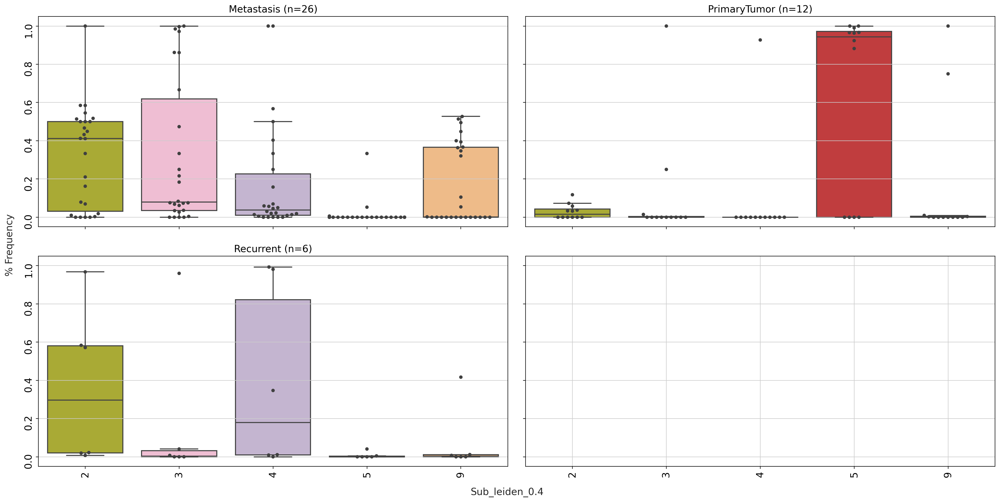

In [255]:
import seaborn as sns
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, constrained_layout=True,
                                             figsize=(20,10))
sns.set_style("white")
sns.boxplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "Metastasis"], showfliers = False,palette="tab20_r",ax=ax1,order=order_agebin)
sns.swarmplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "Metastasis"], color=".25",size=5,ax=ax1,order=order_agebin)
sns.boxplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "PrimaryTumor"], showfliers = False,palette="tab20_r",ax=ax2,order=order_agebin)
sns.swarmplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "PrimaryTumor"], color=".25",size=5,ax=ax2,order=order_agebin)
sns.boxplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "Recurrent"], showfliers = False,palette="tab20_r",ax=ax3,order=order_agebin)
sns.swarmplot(x="Unnamed: 2", y="Sub_leiden_0.42", data=tmp2.loc[tmp2['Type']== "Recurrent"], color=".25",size=5,ax=ax3,order=order_agebin)
ax1.set_ylabel(" ",fontsize=3)
ax2.set_ylabel(" ",fontsize=3)
ax3.set_ylabel(" ",fontsize=3)
ax4.set_ylabel(" ",fontsize=3)
ax1.set_xlabel(" ",fontsize=3)
ax2.set_xlabel(" ",fontsize=3)
ax3.set_xlabel(" ",fontsize=3)
ax4.set_xlabel(" ",fontsize=3)
ax1.axes.xaxis.set_visible(True)
ax2.axes.xaxis.set_visible(True)
ax1.tick_params(labelrotation=90)
ax2.tick_params(labelrotation=90)
ax3.tick_params(labelrotation=90)
ax4.tick_params(labelrotation=90)
ax1.title.set_text("Metastasis (n={0})".format(len(tmp2.loc[tmp2['Type']== "Metastasis"]['SampleID'].unique()) ))
ax2.title.set_text("PrimaryTumor (n={0})".format(len(tmp2.loc[tmp2['Type']== "PrimaryTumor"]['SampleID'].unique()) ))
ax3.title.set_text("Recurrent (n={0})".format(len(tmp2.loc[tmp2['Type']== "Recurrent"]['SampleID'].unique()) ))
plt.tight_layout()
fig.text(0.5, 0.001, 'Sub_leiden_0.4', va='center', ha='center', fontsize=rcParams['axes.labelsize'])
fig.text(0.001, 0.5, '% Frequency ', va='center', ha='center', rotation='vertical', fontsize=rcParams['axes.labelsize'])
plt.show()

## Export

In [256]:
CD8obj.write("/home/lugli/spuccio/Projects/SP039/FileH5AD_concatenated/Integrated_CD8_RES04.h5ad")